# Importing datasets from Kaggle

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
from google.colab import files

files.upload() #this will prompt you to upload the kaggle.json

Saving kaggle.json to kaggle (6).json


{'kaggle (6).json': b'{"username":"carvalhobr","key":"774e09805e4d6e369c78cc7f086c7485"}'}

In [5]:
!ls -lha kaggle.json

-rw-r--r-- 1 root root 66 Jul 21 07:46 kaggle.json


In [6]:
!pip install -q kaggle

In [7]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [8]:
!chmod 600 /root/.kaggle/kaggle.json

In [9]:
!pwd

/content


In [10]:
!kaggle datasets list

ref                                                            title                                             size  lastUpdated          downloadCount  voteCount  usabilityRating  
-------------------------------------------------------------  -----------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
alphiree/cardiovascular-diseases-risk-prediction-dataset       Cardiovascular Diseases Risk Prediction Dataset    5MB  2023-07-03 12:12:19           4314        176  1.0              
nelgiriyewithana/countries-of-the-world-2023                   Global Country Information Dataset 2023           23KB  2023-07-08 20:37:33           3157        117  1.0              
arnavsmayan/netflix-userbase-dataset                           Netflix Userbase Dataset                          25KB  2023-07-04 07:38:41           4308         88  1.0              
iamsouravbanerjee/data-science-salaries-2023                   Latest Data Scien

In [11]:
!kaggle datasets download -d navoneel/brain-mri-images-for-brain-tumor-detection
!unzip brain-mri-images-for-brain-tumor-detection.zip

brain-mri-images-for-brain-tumor-detection.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  brain-mri-images-for-brain-tumor-detection.zip
replace brain_tumor_dataset/no/1 no.jpeg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [12]:
!kaggle datasets download -d denizkavi1/brain-tumor
!unzip brain-tumor.zip

brain-tumor.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  brain-tumor.zip
replace 1/2300.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

# **Brain Tumor Image Dataset** (https://www.kaggle.com/datasets/denizkavi1/brain-tumor/code?datasetId=1454010&sortBy=voteCount)
# 1 = Meningioma
# 2 = Glioma
# 3 = Pituitary tumor

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import random
import os
from IPython.display import Image

In [14]:
!ls

 1						 'kaggle (3).json'
 2						 'kaggle (4).json'
 3						 'kaggle (5).json'
 brain-mri-images-for-brain-tumor-detection.zip  'kaggle (6).json'
 brain_tumor_dataset				  kaggle.json
 brain-tumor.zip				  no
 drive						  sample_data
'kaggle (1).json'				  yes
'kaggle (2).json'


In [15]:
folder1 = '/kaggle.json/1'
folder2 = '/kaggle.json/2'
folder3 = '/kaggle.json/3'

In [16]:
folder = folder1
def get_folder(folder):
    plt.figure(figsize=(11,11))
    for i in range(100):
        file = random.choice(os.listdir(folder))
        image_path= os.path.join(folder, file)
        img=mpimg.imread(image_path)
        ax=plt.subplot(10,10,i+1)
        ax.title.set_text(file)
        plt.imshow(img)

(708, None)

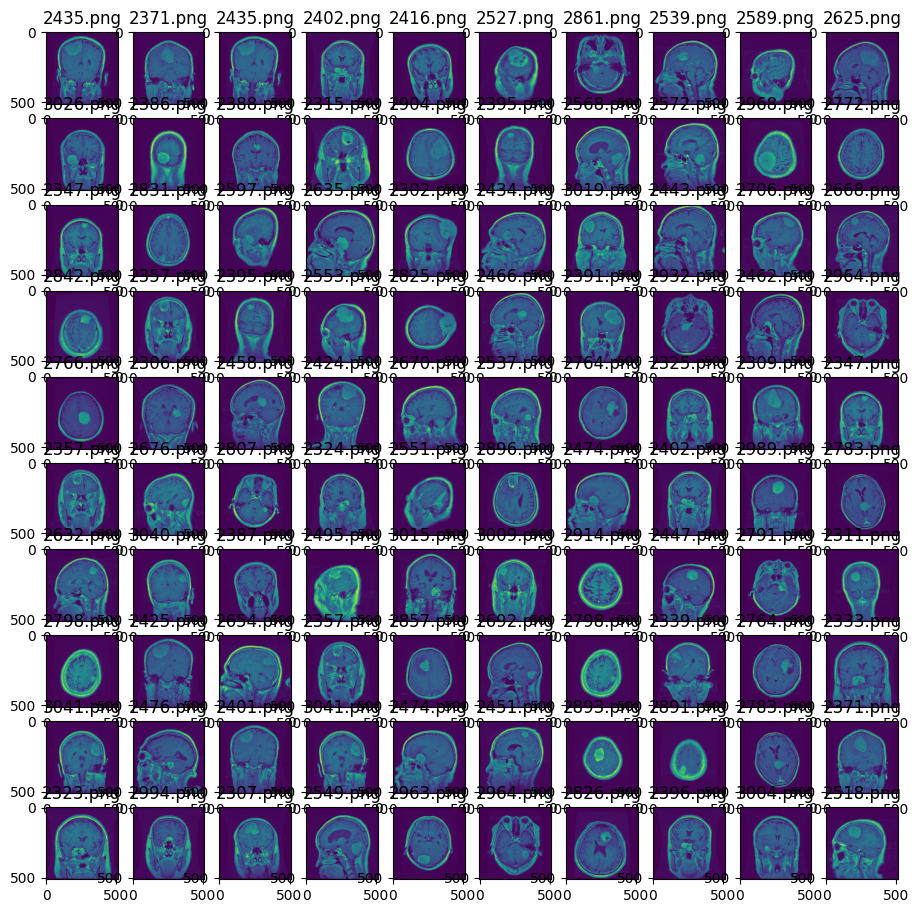

In [17]:
files = os.listdir('1')
np.size(files), get_folder('1')

(1426, None)

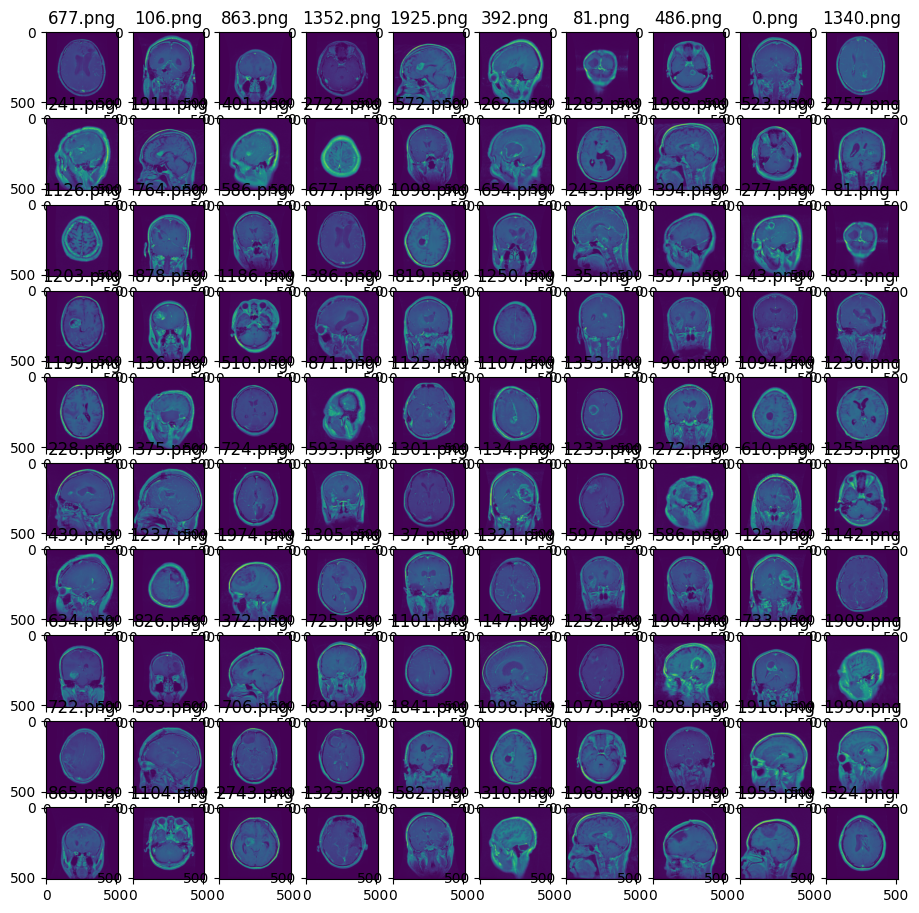

In [18]:
files = os.listdir('2')
np.size(files), get_folder('2')

(930, None)

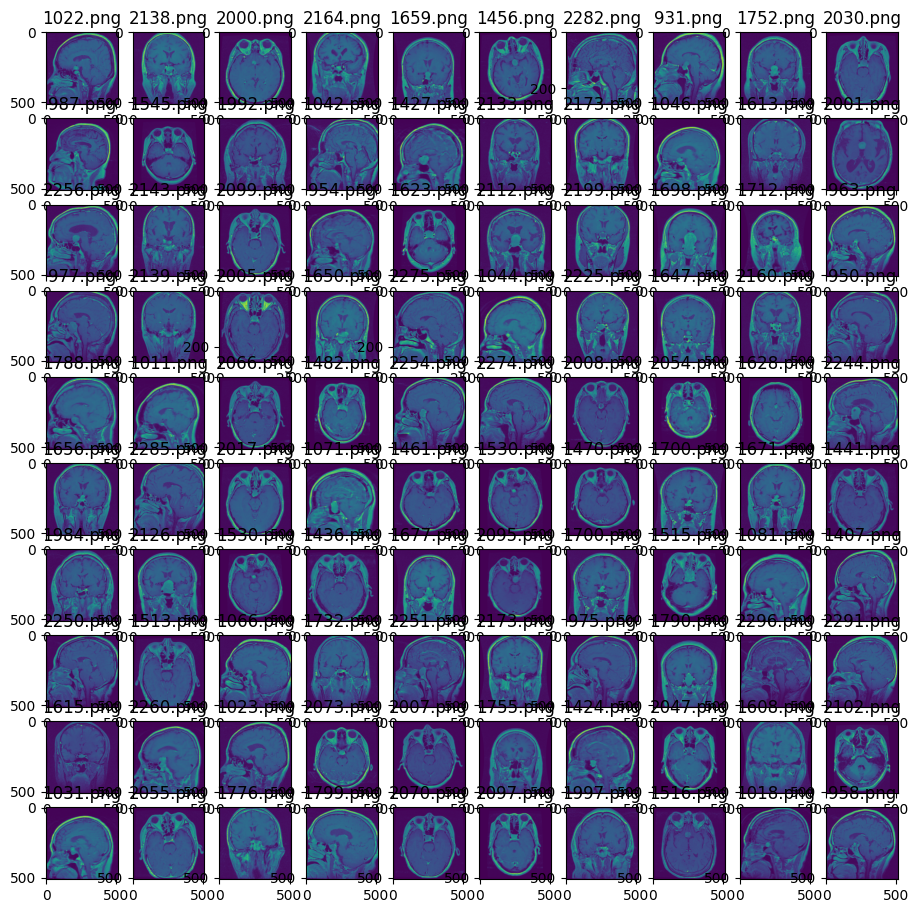

In [19]:
files = os.listdir('3')
np.size(files), get_folder('3')

# **Segmentation**

In [33]:
import pandas as pd
from sklearn.cluster import KMeans

folder = folder1
def kmean_seg(folder):
    plt.figure(figsize=(11,11))
    for i in range(100):
        file = random.choice(os.listdir(folder))
        image_path= os.path.join(folder, file)
        image_seg=mpimg.imread(image_path)
        # print(np.unique(image_seg))
        #print('image_seg', image_seg)
        # image_seg= np.array(img)
        pixels = image_seg.reshape(-1, 4)
        pixels_df = pd.DataFrame(pixels, columns=['R', 'G', 'B','A'])
        # print('pixels_df', pixels_df)


        clf = KMeans(n_clusters=3, n_init='auto')
        clf.fit(pixels)
        pixels_seg0 = clf.cluster_centers_[clf.labels_]
        # print('pixels_seg0', pixels_seg0)
        # pixels_seg = np.clip(pixels_seg0.astype('uint8'), 0, 255)
        # print('pixels_seg', pixels_seg)
        image_seg2 = pixels_seg0.reshape(image_seg.shape)
        #print(np.unique(image_seg2))
        #print('image_seg2', image_seg2)

        #ax=plt.subplot(10,10,i+1)
        #ax.title.set_text(file)

        plt.figure(figsize=(5, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(image_seg)
        plt.title('Original picture')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(image_seg2)
        plt.title('Segmented Picture')
        plt.axis('off')

        plt.show()


<Figure size 1100x1100 with 0 Axes>

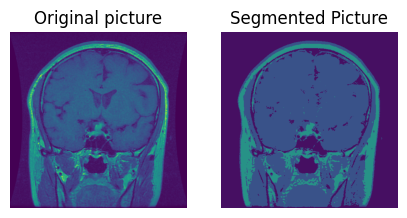

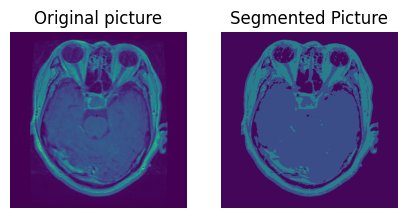

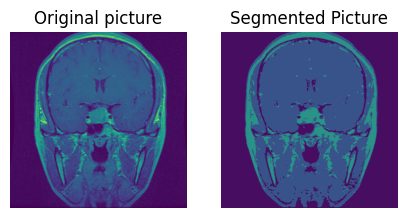

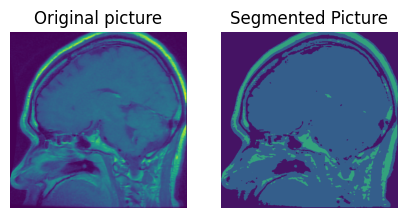

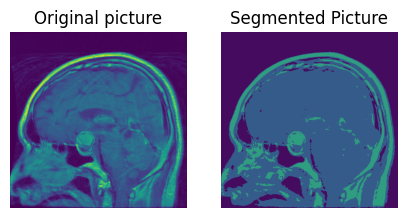

...

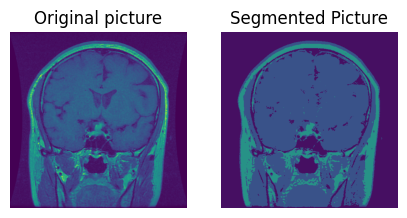

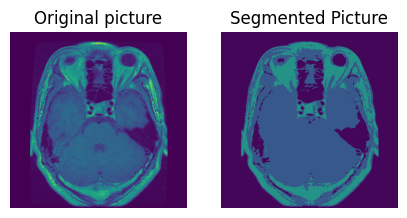

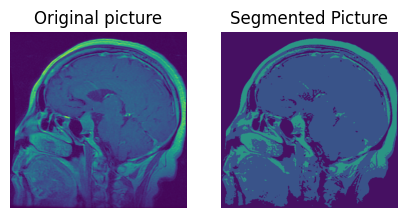

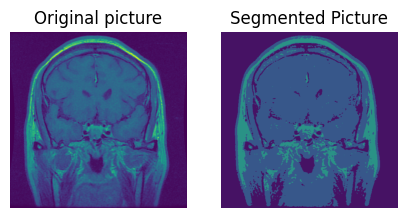

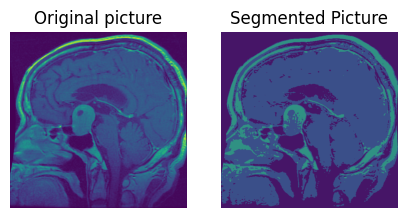

(930, None)

In [34]:
files = os.listdir('3')
np.size(files), kmean_seg('3')

# **Augmentation**

In [49]:
import cv2
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import img_to_array
from tensorflow.keras.utils import array_to_img


folder = folder1
def aug_image(folder):
    plt.figure(figsize=(11,11))
    for i in range(100):
        file = random.choice(os.listdir(folder))
        image_path= os.path.join(folder, file)
        aug = ImageDataGenerator(channel_shift_range=0.3,width_shift_range=0.1, height_shift_range=0.1, rotation_range = 10,shear_range = 0.15,zoom_range = 0.5)


        img=mpimg.imread(image_path)
        # image = load_img(image_path)
        # print(image)
        # arrimage=img_to_array(image)
        # print(img)
        # print(img.shape)
        # print(type(img))
        arrimage= img.reshape((1, ) + img.shape)
        # print(arrimage)
        # print(arrimage.shape)
        new_image= aug.flow(arrimage)
        # print(new_image)
        image1 = next(new_image)[0]
        # print(image1)
        # print(image1.shape)
        ax=plt.subplot(10,10,i+1)
        ax.title.set_text(file)
        plt.imshow(image1)


(708, None)

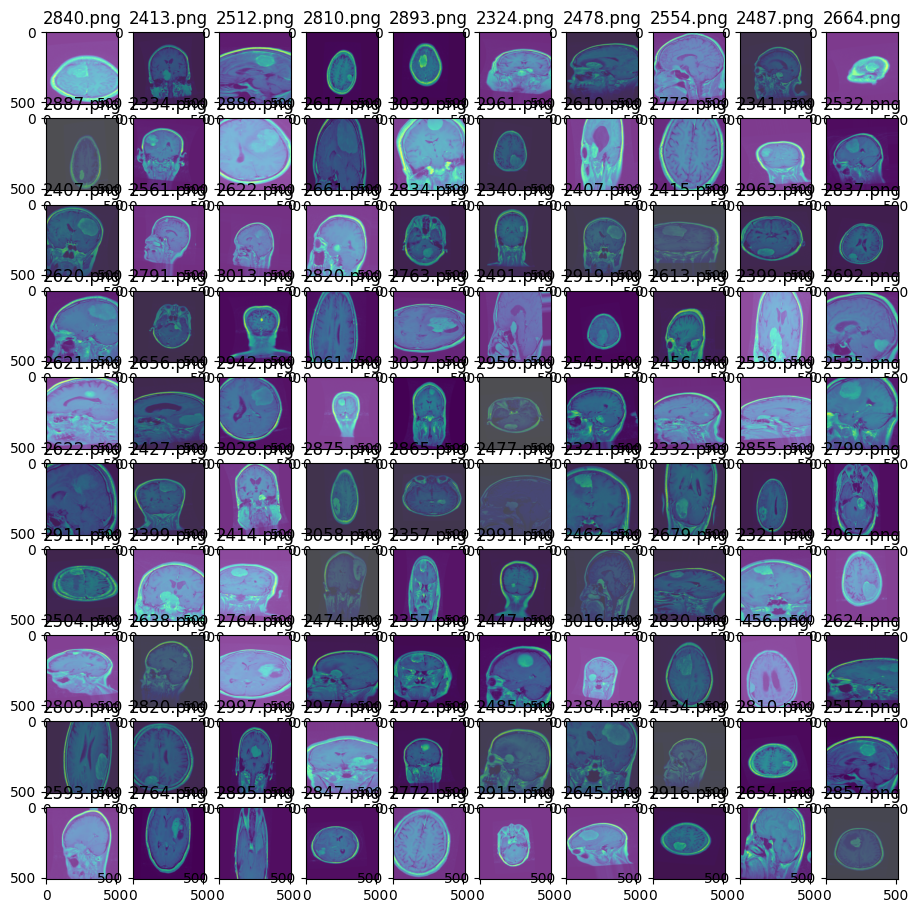

In [50]:
files = os.listdir('1')
np.size(files), aug_image('1')

(1426, None)

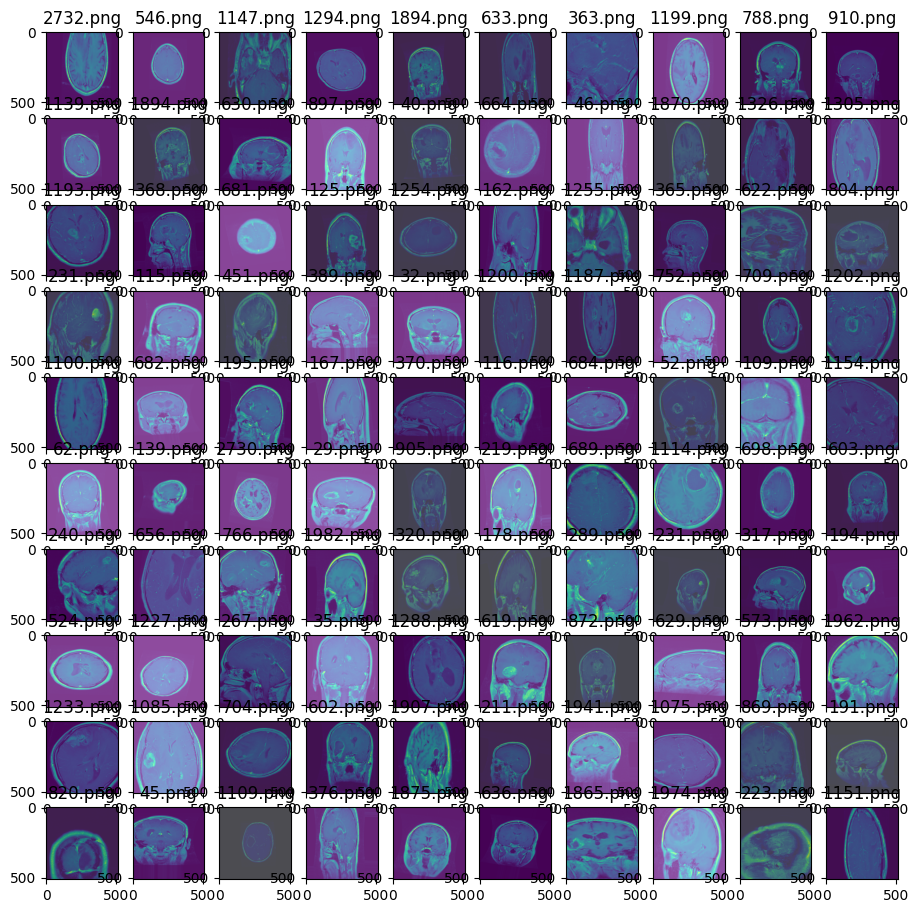

In [51]:
files = os.listdir('2')
np.size(files), aug_image('2')

(930, None)

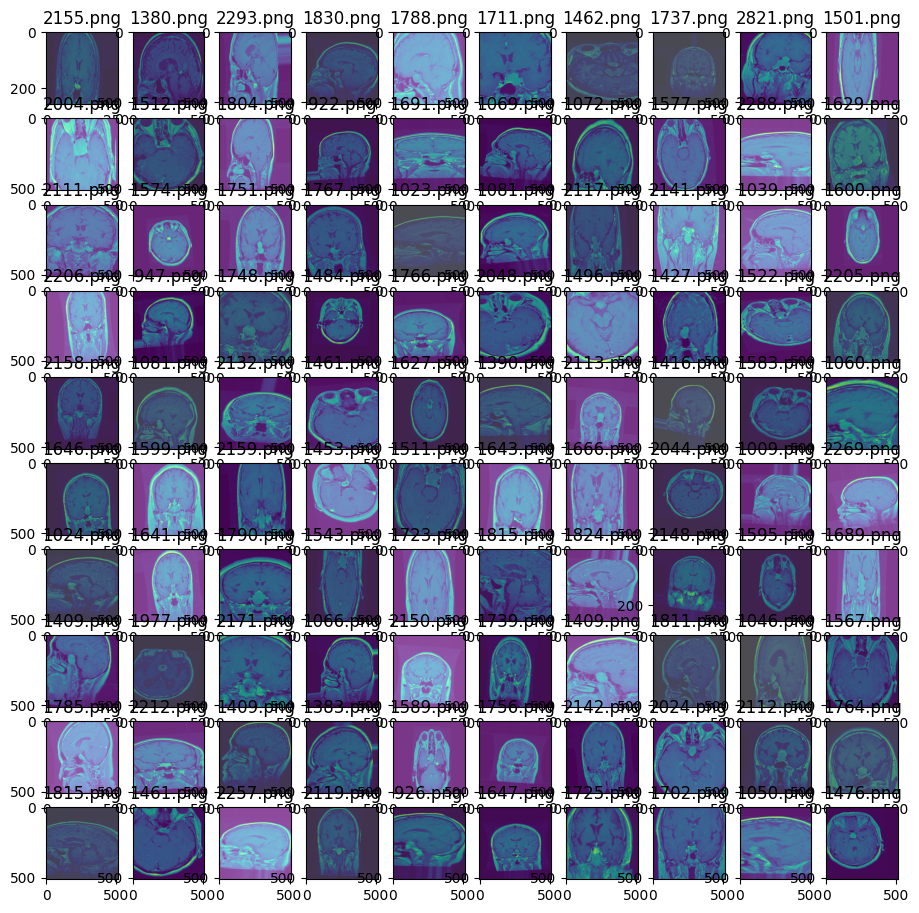

In [52]:
files = os.listdir('3')
np.size(files), aug_image('3')

Flip

In [ ]:
# import cv2
# folder = folder1
# def flip_image(folder):
#     plt.figure(figsize=(11,11))
#     for i in range(100):
#         file = random.choice(os.listdir(folder))
#         image_path= os.path.join(folder, file)
#         img=mpimg.imread(image_path)
#         #image = cv2.imread(image_path,1)
#         new_image2= cv2.flip(img,0)
#         ax=plt.subplot(10,10,i+1)
#         ax.title.set_text(file)
#         plt.imshow(new_image2)

In [ ]:
# files = os.listdir('1')
# np.size(files), flip_image('1')

In [ ]:
# files = os.listdir('2')
# np.size(files), flip_image('2')

In [ ]:
# files = os.listdir('3')
# np.size(files), flip_image('3')

In [ ]:
# folder = folder1
# import torch
# import torch.nn as nn
# import torchvision.transforms as T
# from PIL import Image

# def Convolution1(folder):
#     plt.figure(figsize=(11,11))
#     for i in range(100):
#         file = random.choice(os.listdir(folder))
#         image_path= os.path.join(folder, file)
#         #img=mpimg.imread(image_path)
#         #image = cv2.imread(image_path,1)

#         image3 = Image.open(image_path)
#         # convert input image to torch tensor
#         Input = T.ToTensor()(image3)
# 	      # Define the convolution operation
#         conv = nn.Conv2d(in_channels=4, out_channels=4, kernel_size=2,stride=1, bias=True)
#         output = conv(Input)
#         print('Output Tensor :',output.shape)
#         # squeeze image
#         Out_img = output.squeeze(0)
#         # convert tensor to image
#         Out_img = T.ToPILImage()(Out_img)
#         ax=plt.subplot(10,10,i+1)
#         ax.title.set_text(file)
#         plt.imshow(Out_img)


In [ ]:
# files = os.listdir('1')
# np.size(files), Convolution1('1')


# **Brain MRI Images for Brain Tumor Detection** (https://www.kaggle.com/navoneel/brain-mri-images-for-brain-tumor-detection)
# No = No tumor (0)
# Yes = Tumor (1)

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import random
import os
from IPython.display import Image

In [ ]:
!ls

In [ ]:
def get_folder(folder):
    plt.figure(figsize=(11,11))
    for i in range(100):
        file = random.choice(os.listdir(folder))
        image_path= os.path.join(folder, file)
        img=mpimg.imread(image_path)
        ax=plt.subplot(10,10,i+1)
        ax.title.set_text(file)
        plt.imshow(img)

In [ ]:
files = os.listdir('brain_tumor_dataset')
files

In [ ]:
files = os.listdir('brain_tumor_dataset')
np.size(files), get_folder('yes')


In [ ]:
files = os.listdir('brain_tumor_dataset')
np.size(files), get_folder('no')

In [ ]:
import cv2
#import numpy as np
#import matplotlib.pyplot as plt

image = cv2.imread(r"/content/1/2314.png",1)
# Loading the image

new_image= cv2.resize(image,(80,80))

plt.imshow(new_image)

plt.show()


In [ ]:
img=mpimg.imread("/content/1/2314.png")
#print(img)
img.shape
plt.imshow(img)

plt.show()
